In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from utils.CaImageCSV import CaImageCSV
import utils.sulfur.constant as const

In [2]:
animal_name = 'ID181106CreC'
file_path = './resources/%s_Longitudinal_Traces.csv' % animal_name
csv = CaImageCSV(file_path)

/opt/conda/lib/python3.8/site-packages/pandas/core/indexing.py:1843: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


In [3]:
csv.engram_cells()

['C006',
 'C017',
 'C051',
 'C065',
 'C080',
 'C092',
 'C112',
 'C115',
 'C117',
 'C134',
 'C149',
 'C152',
 'C178',
 'C187',
 'C188',
 'C197',
 'C203',
 'C214',
 'C216',
 'C221',
 'C227',
 'C251',
 'C309',
 'C311',
 'C315',
 'C326',
 'C340',
 'C344',
 'C346',
 'C350',
 'C354',
 'C357',
 'C359',
 'C377',
 'C378',
 'C393',
 'C397',
 'C416',
 'C467',
 'C468']

In [4]:
csv.non_engram_cells()

['C000',
 'C002',
 'C003',
 'C005',
 'C007',
 'C008',
 'C010',
 'C011',
 'C012',
 'C013',
 'C014',
 'C015',
 'C016',
 'C018',
 'C019',
 'C020',
 'C021',
 'C022',
 'C023',
 'C024',
 'C025',
 'C026',
 'C027',
 'C028',
 'C029',
 'C030',
 'C031',
 'C032',
 'C033',
 'C034',
 'C035',
 'C036',
 'C037',
 'C038',
 'C039',
 'C040',
 'C041',
 'C042',
 'C043',
 'C044',
 'C045',
 'C047',
 'C048',
 'C049',
 'C050',
 'C052',
 'C053',
 'C054',
 'C055',
 'C056',
 'C057',
 'C058',
 'C059',
 'C060',
 'C061',
 'C062',
 'C063',
 'C064',
 'C066',
 'C067',
 'C068',
 'C069',
 'C070',
 'C071',
 'C072',
 'C073',
 'C074',
 'C075',
 'C076',
 'C077',
 'C078',
 'C079',
 'C081',
 'C082',
 'C083',
 'C084',
 'C085',
 'C086',
 'C087',
 'C088',
 'C090',
 'C091',
 'C094',
 'C095',
 'C096',
 'C097',
 'C098',
 'C099',
 'C100',
 'C101',
 'C102',
 'C103',
 'C104',
 'C105',
 'C106',
 'C107',
 'C109',
 'C110',
 'C111',
 'C113',
 'C114',
 'C116',
 'C118',
 'C119',
 'C120',
 'C121',
 'C122',
 'C123',
 'C124',
 'C125',
 'C126',
 

In [7]:
csv.engrams

{'C000': False,
 'C002': False,
 'C003': False,
 'C005': False,
 'C006': True,
 'C007': False,
 'C008': False,
 'C010': False,
 'C011': False,
 'C012': False,
 'C013': False,
 'C014': False,
 'C015': False,
 'C016': False,
 'C017': True,
 'C018': False,
 'C019': False,
 'C020': False,
 'C021': False,
 'C022': False,
 'C023': False,
 'C024': False,
 'C025': False,
 'C026': False,
 'C027': False,
 'C028': False,
 'C029': False,
 'C030': False,
 'C031': False,
 'C032': False,
 'C033': False,
 'C034': False,
 'C035': False,
 'C036': False,
 'C037': False,
 'C038': False,
 'C039': False,
 'C040': False,
 'C041': False,
 'C042': False,
 'C043': False,
 'C044': False,
 'C045': False,
 'C047': False,
 'C048': False,
 'C049': False,
 'C050': False,
 'C051': True,
 'C052': False,
 'C053': False,
 'C054': False,
 'C055': False,
 'C056': False,
 'C057': False,
 'C058': False,
 'C059': False,
 'C060': False,
 'C061': False,
 'C062': False,
 'C063': False,
 'C064': False,
 'C065': True,
 'C066': Fal

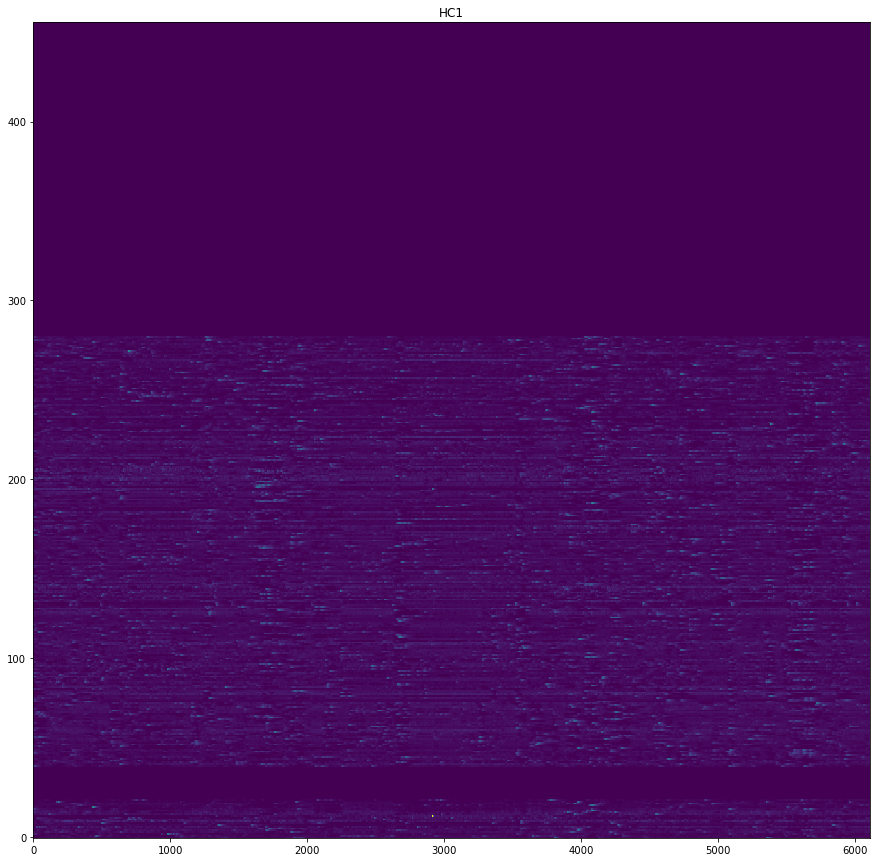

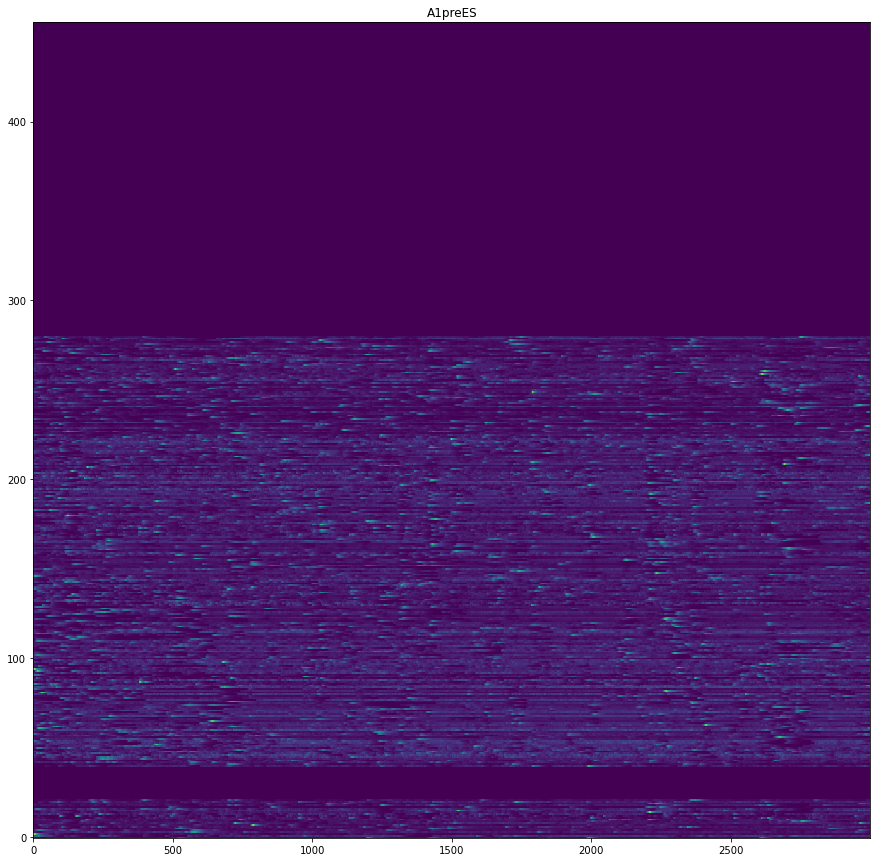

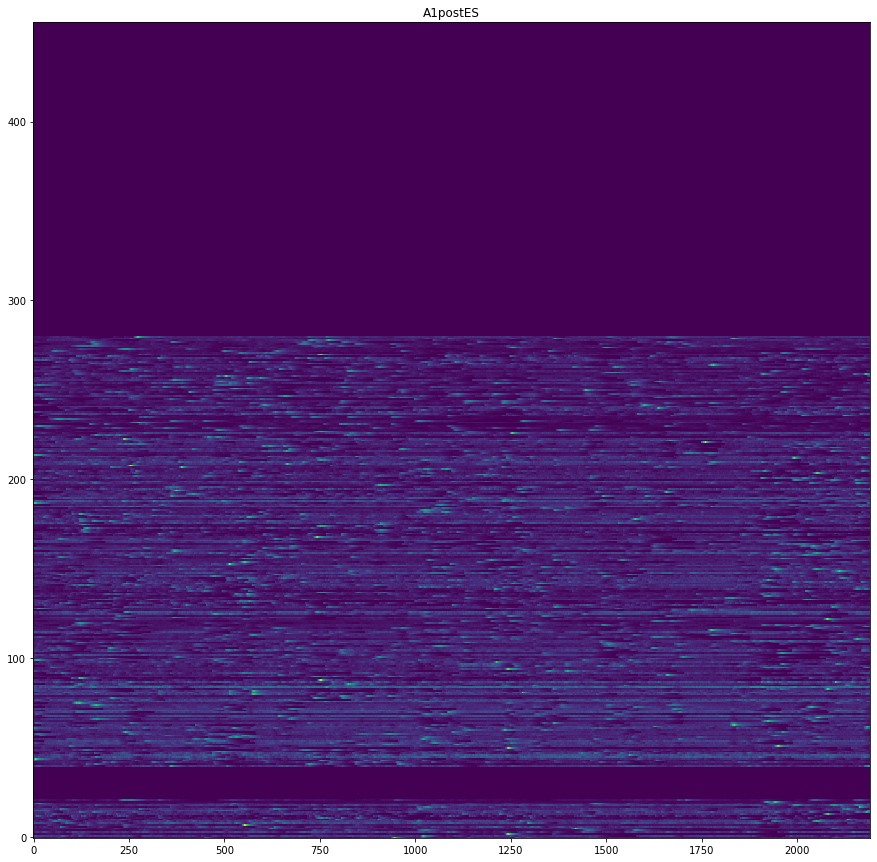

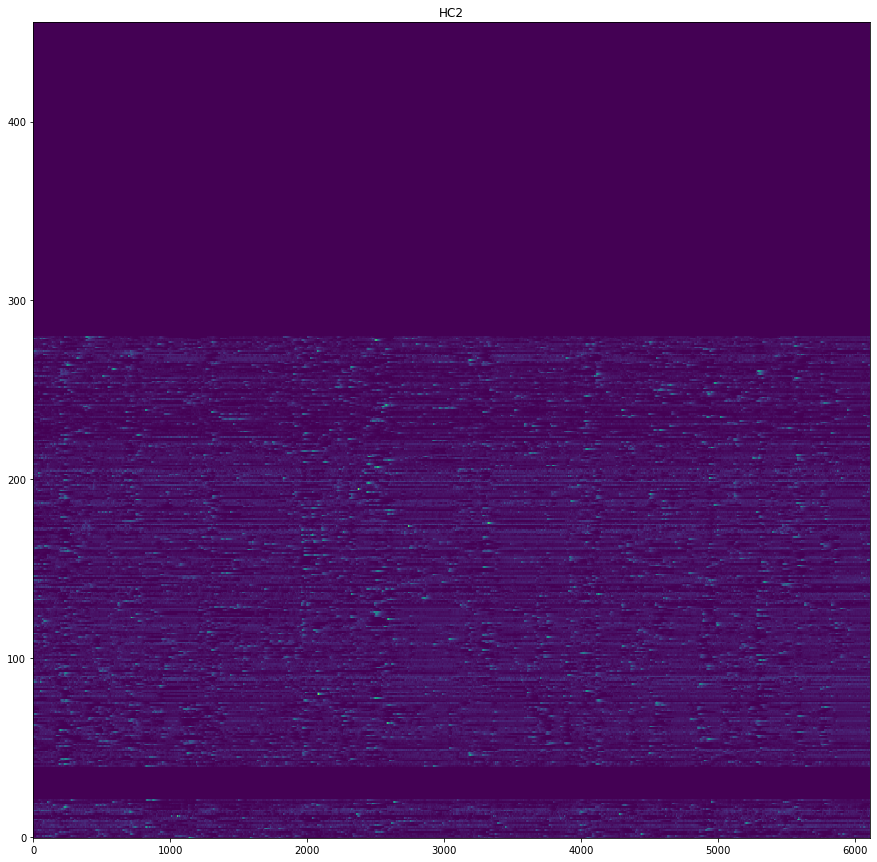

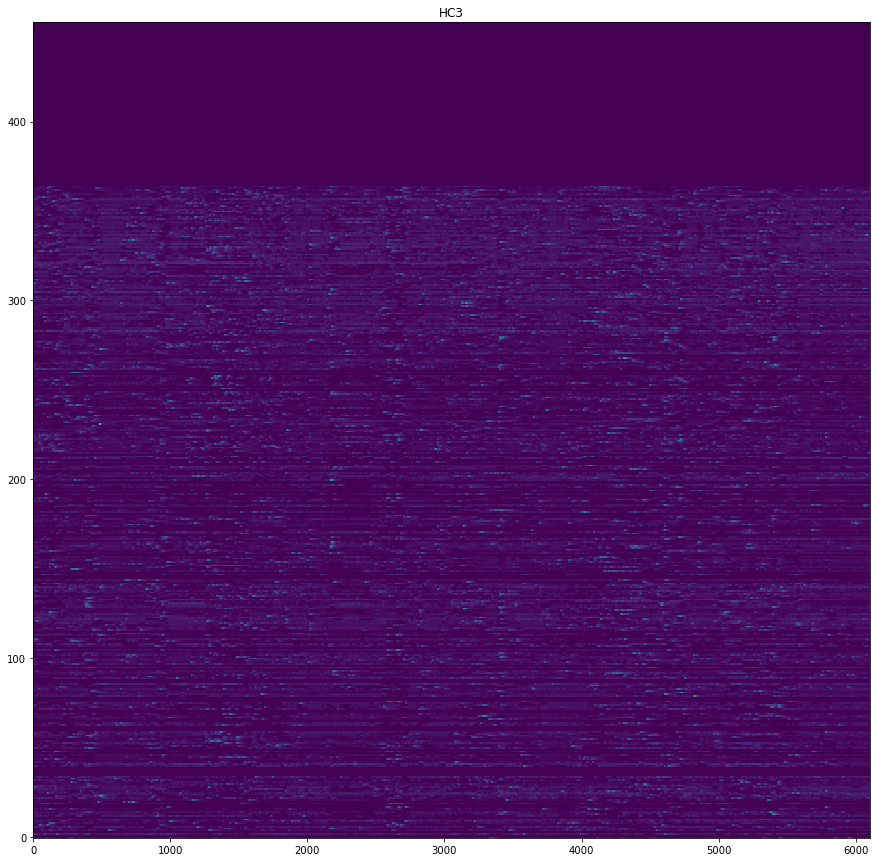

...

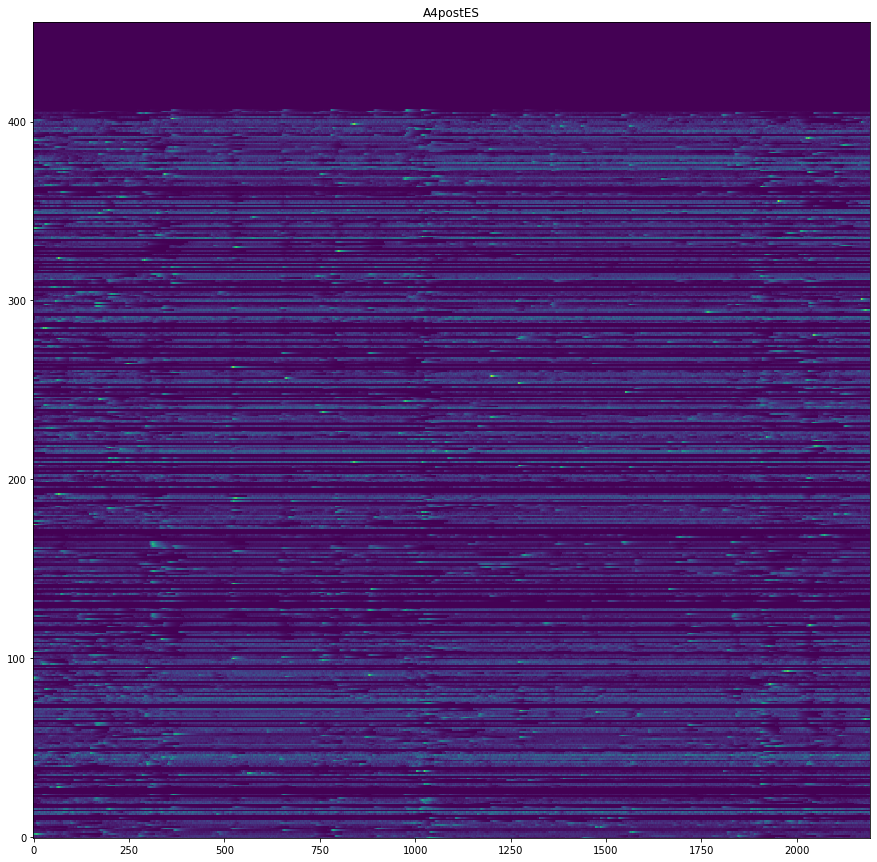

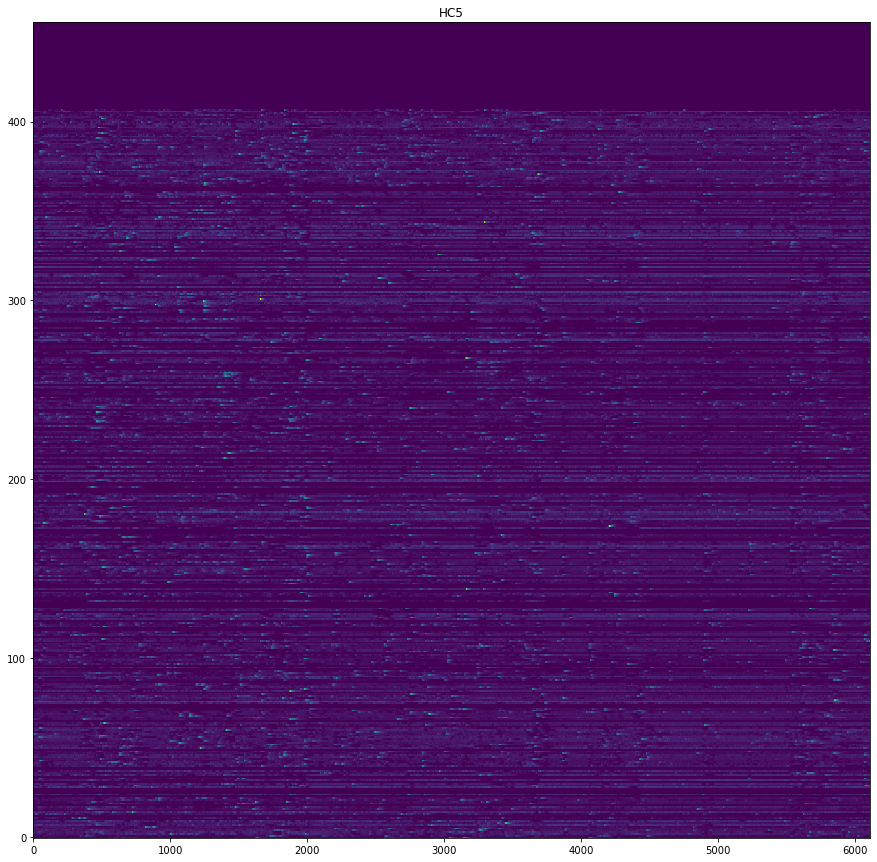

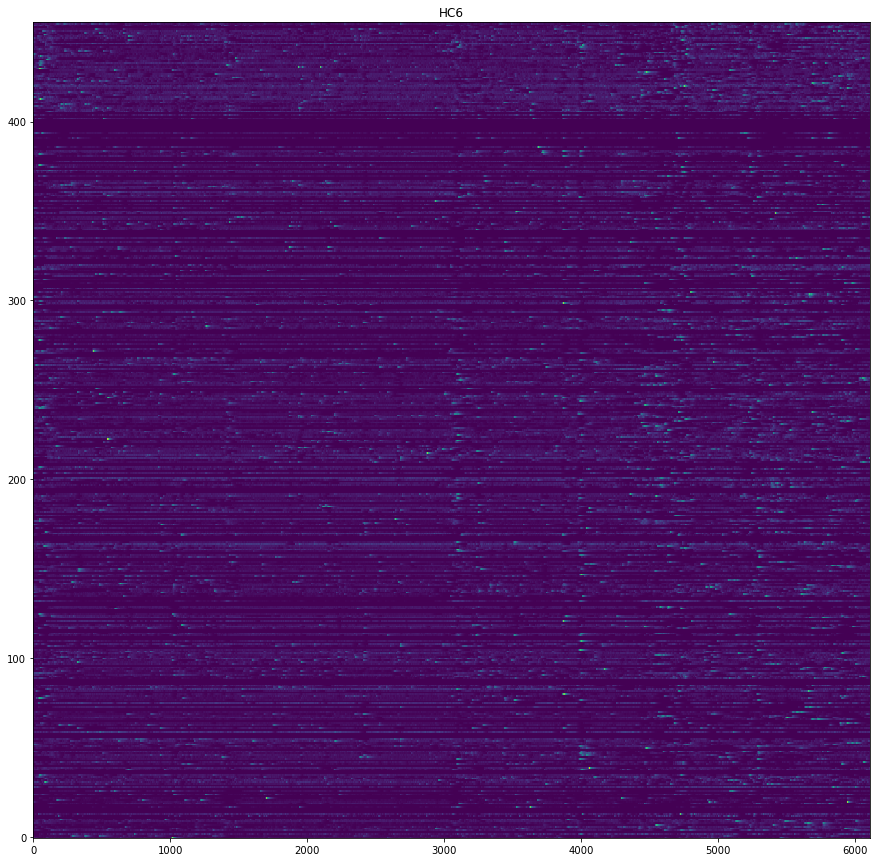

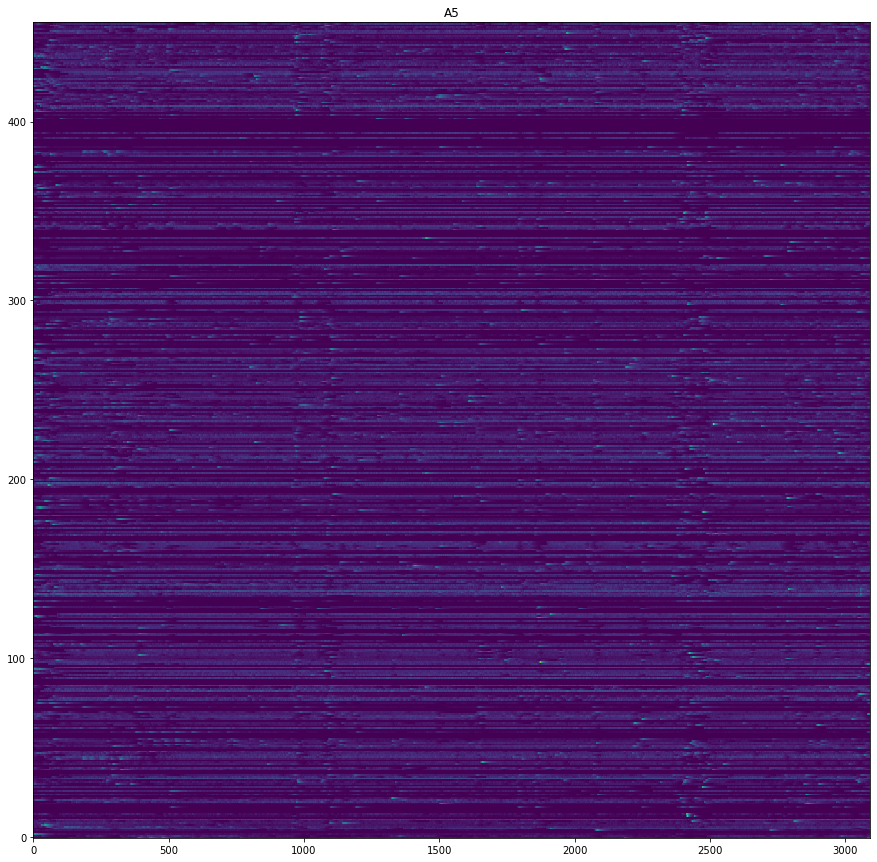

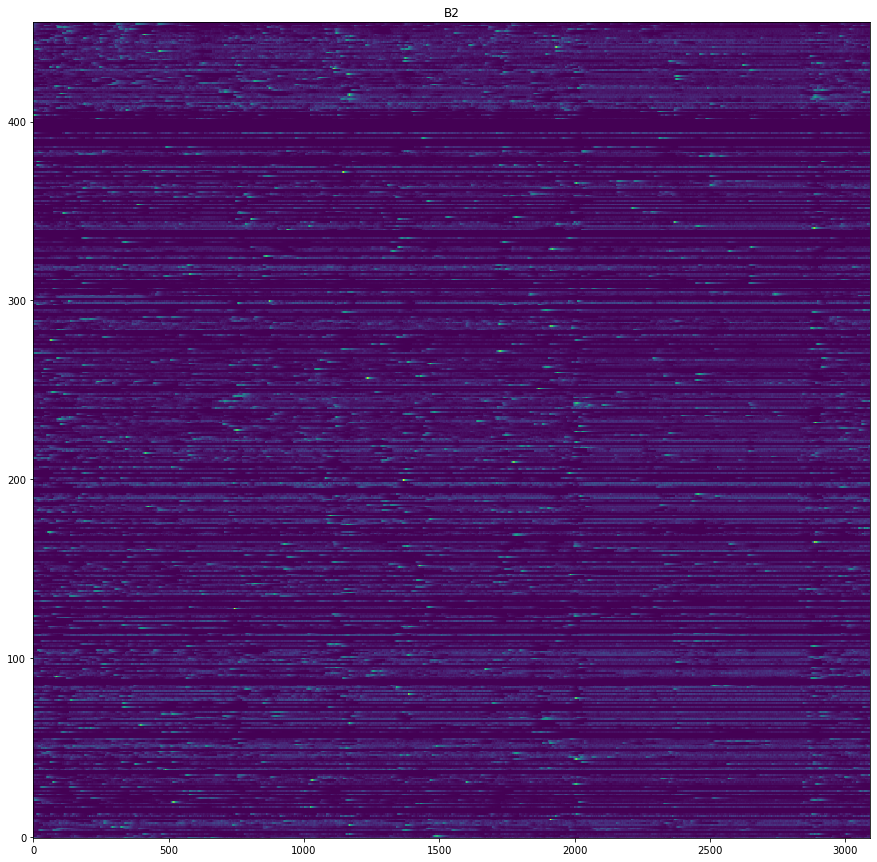

In [5]:
for context_name in const.CONTEXTS:
    fig, aix = plt.subplots(1, figsize=(15, 15))

    context_data = csv.filtered_by_context(context_name)
    context_data = context_data.astype(float)
    optimized_data = csv.optimize_std(context_data.fillna(0.0))
    
    x = np.arange(0, len(context_data))
    y = np.arange(0, len(csv.cell_names))
    X, Y = np.meshgrid(x, y)
    
    aix.pcolormesh(X, Y, optimized_data.T, shading='auto')
    aix.set_title(context_name)
    plt.show()

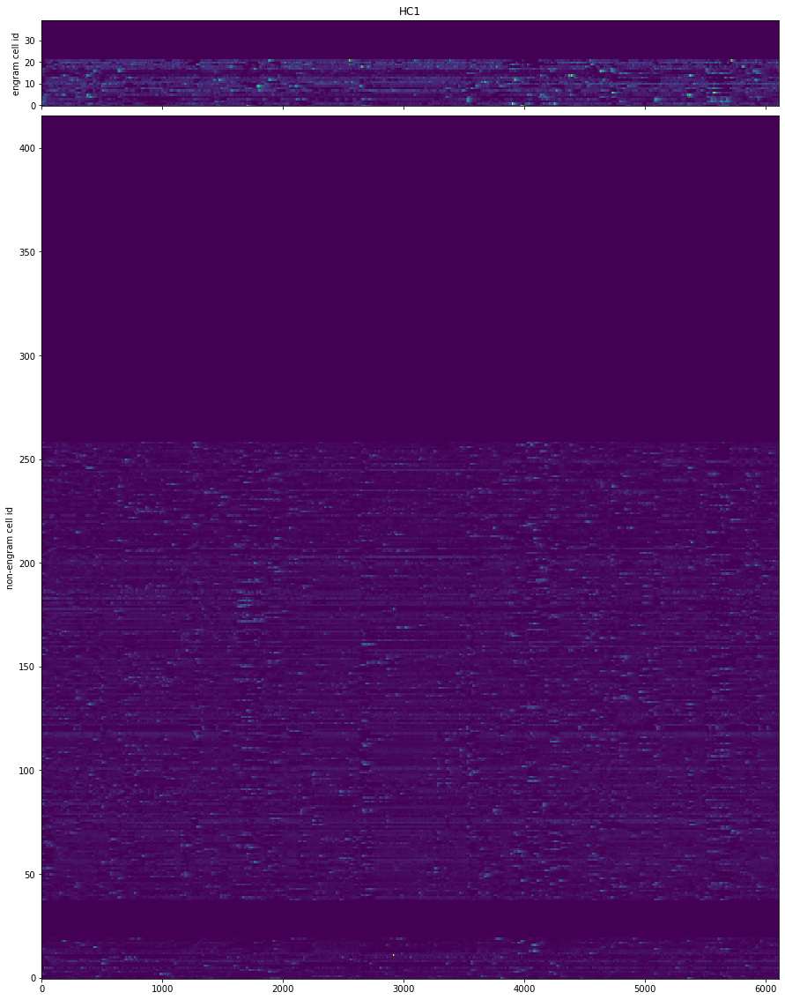

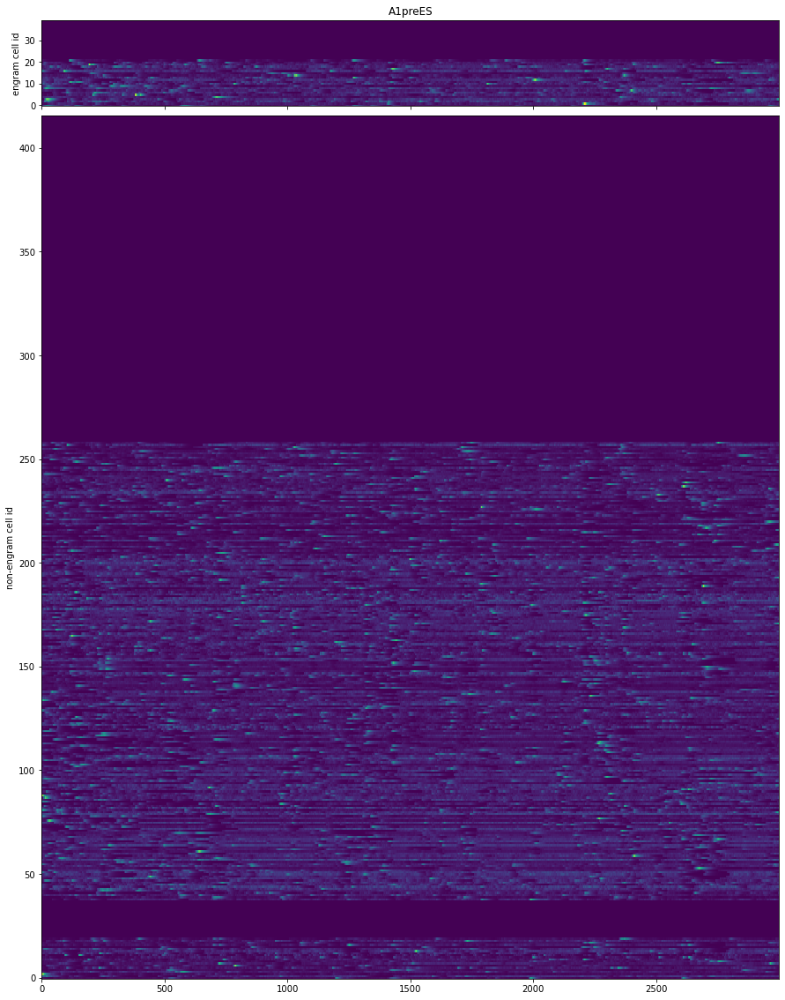

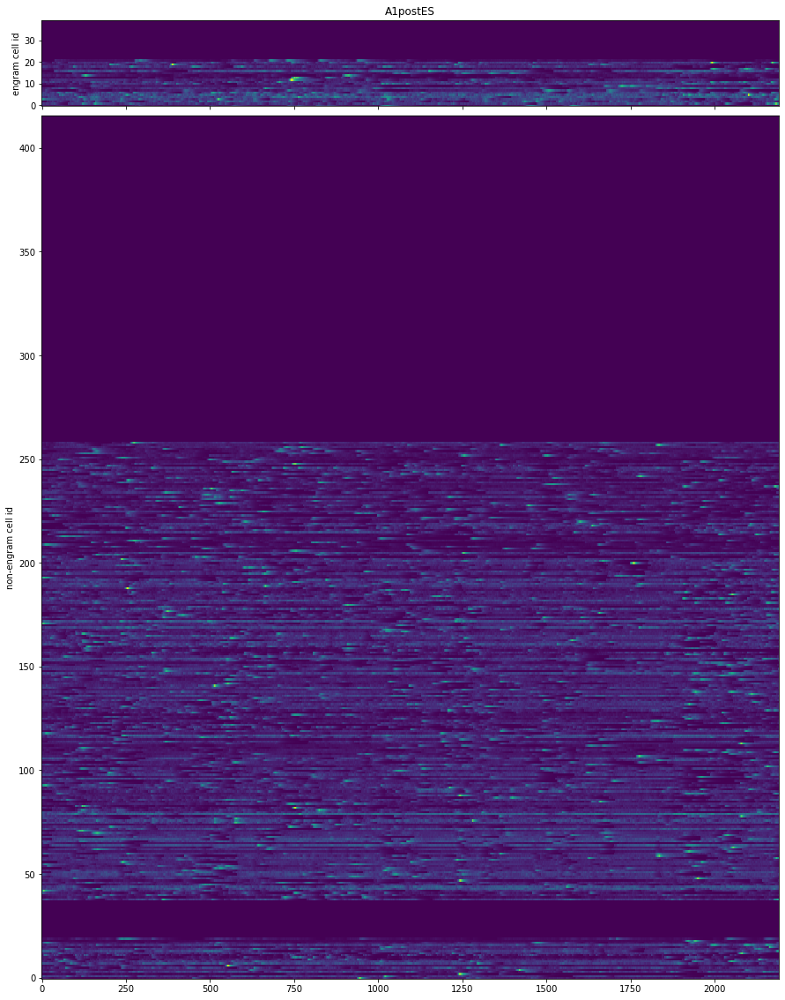

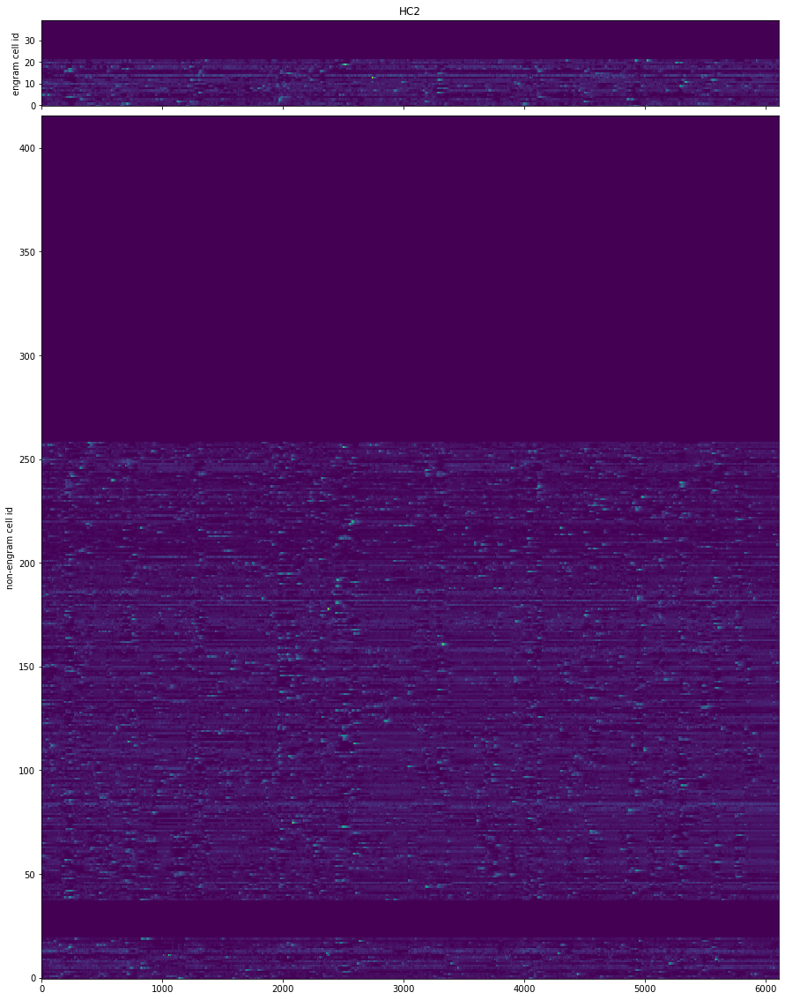

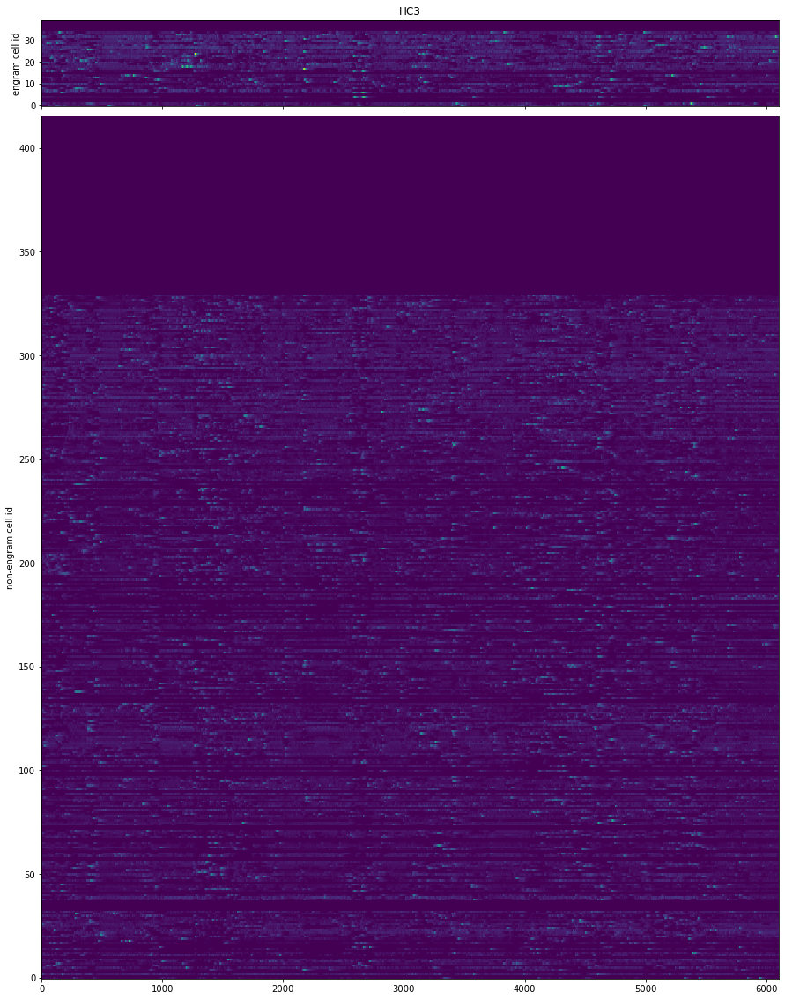

...

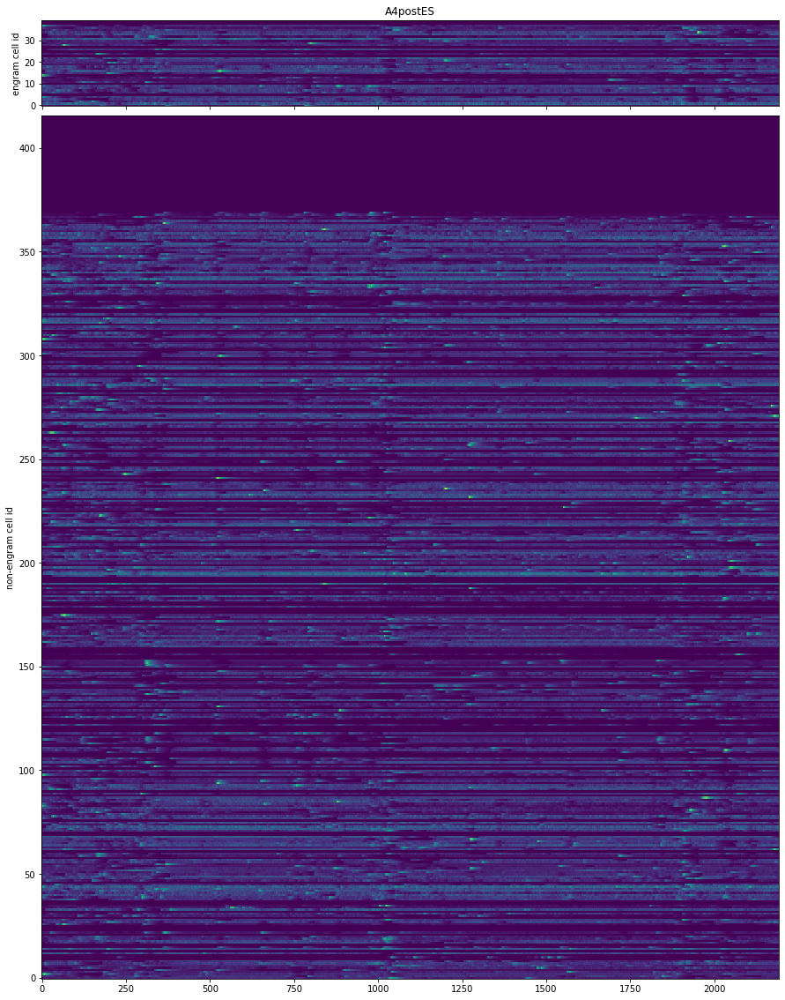

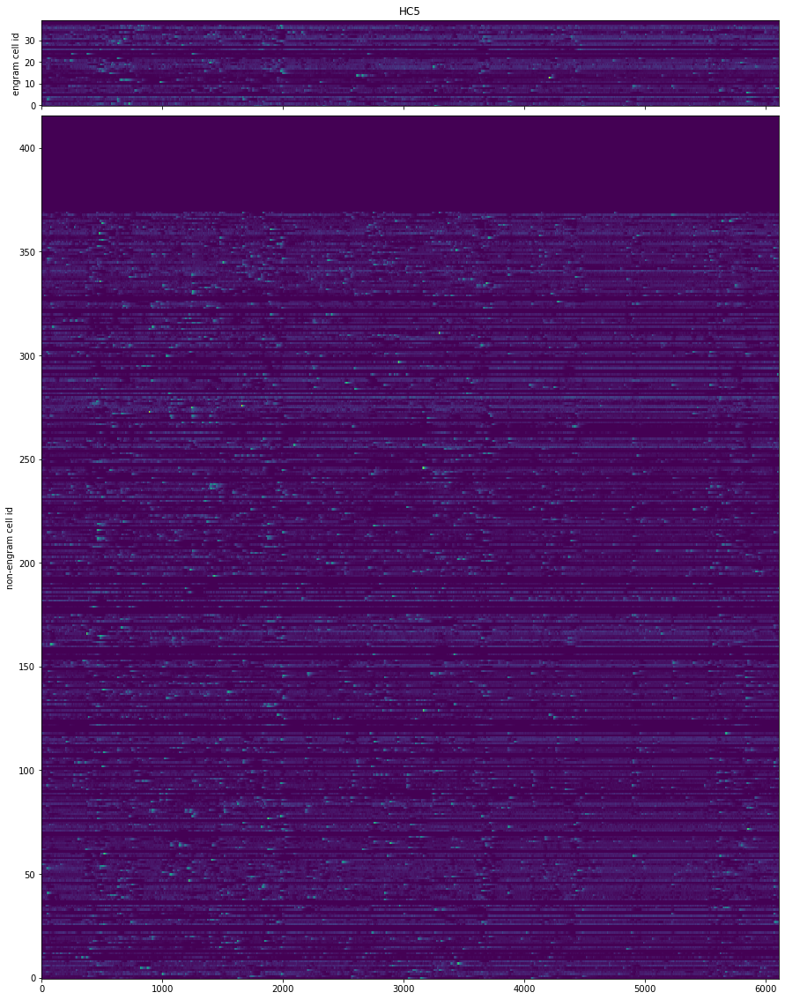

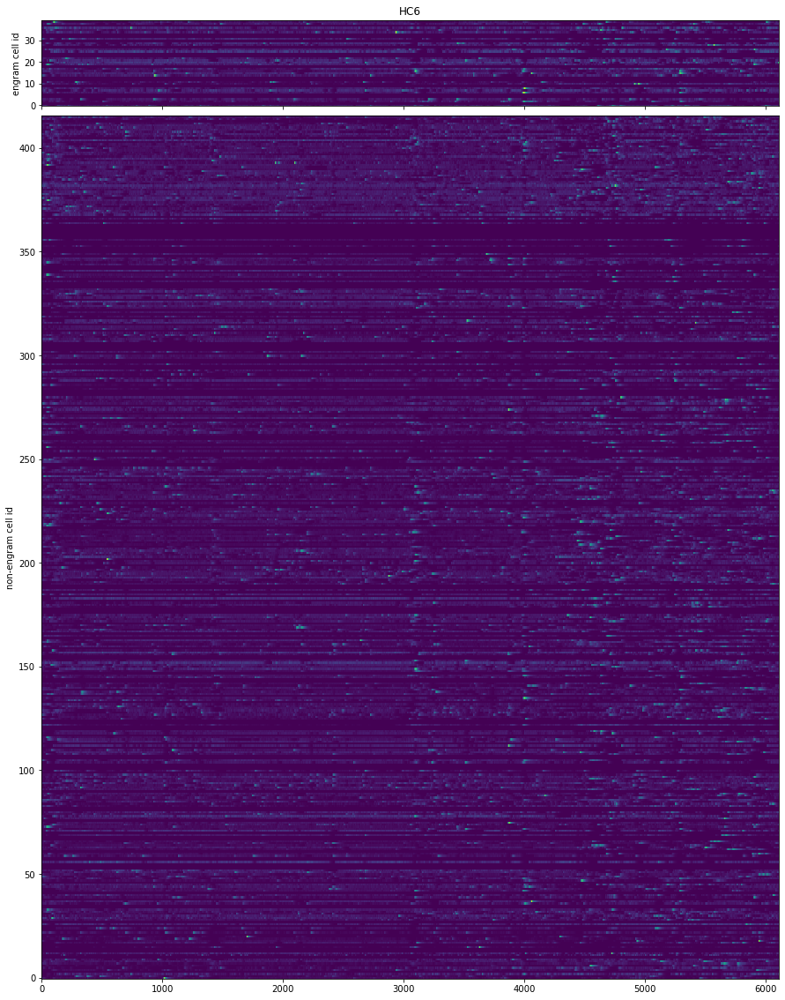

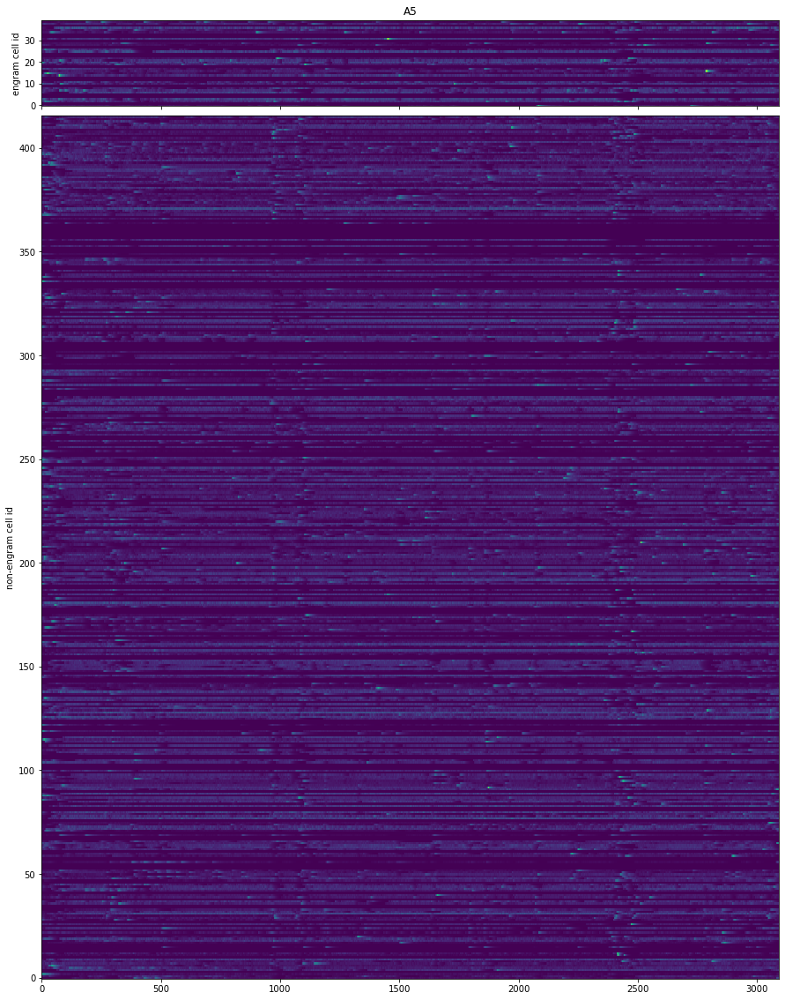

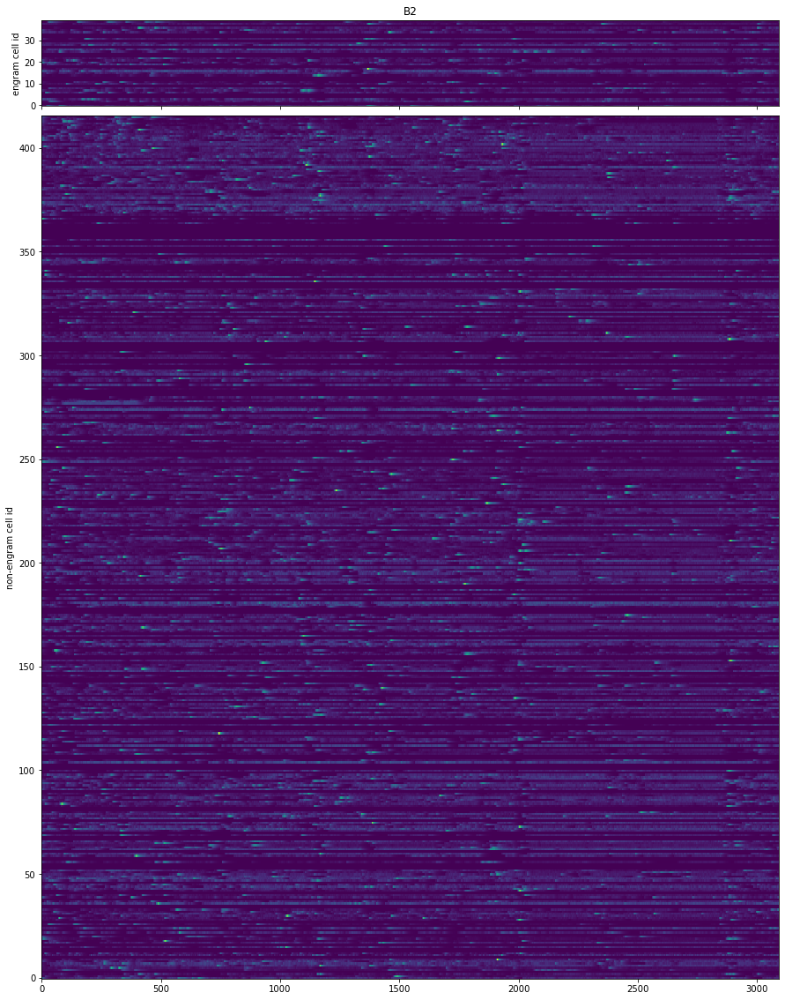

In [29]:
engram_cells = csv.engram_cells()
non_engram_cells = csv.non_engram_cells()
for context_name in const.CONTEXTS:
    fig, aixs = plt.subplots(2, figsize=(15, 20), sharex=True, gridspec_kw={'height_ratios': [1, len(non_engram_cells) // len(engram_cells)]})
    
    context_data = csv.filtered_by_context(context_name)
    context_data = context_data.astype(float)
    optimized_data = csv.optimize_std(context_data.fillna(0.0))
    
    engram_x = np.arange(0, len(context_data))
    engram_y = np.arange(0, len(engram_cells))
    engram_X, engram_Y = np.meshgrid(engram_x, engram_y)
    
    aixs[0].pcolormesh(engram_X, engram_Y, optimized_data.T.loc[engram_cells], shading='auto')
    aixs[0].set_ylabel('engram cell id')
    aixs[0].set_title(context_name)
    
    non_engram_x = np.arange(0, len(context_data))
    non_engram_y = np.arange(0, len(non_engram_cells))
    non_engram_X, non_engram_Y = np.meshgrid(non_engram_x, non_engram_y)
    
    aixs[1].pcolormesh(non_engram_X, non_engram_Y, optimized_data.T.loc[non_engram_cells], shading='auto')
    aixs[1].set_ylabel('non-engram cell id')
    
    plt.subplots_adjust(hspace=0.02)
    
    #plt.show()
    plt.savefig('./resources/normalized_colormap/ID181106CreC/%s.png' % context_name)